<!-- Use h1 for printing on A3 page -->

<h1 style='float:left; font-variant: small-caps;' align='left'>Morphological Priori Constrained Object Detection of Key Structures in Infant Fundus Image</h1>
<!--h2 style='float:left; font-variant: small-caps;' align='center'>Morphological Priori Constrained Object Detection of Key Structures in Infant Fundus Image</h2-->

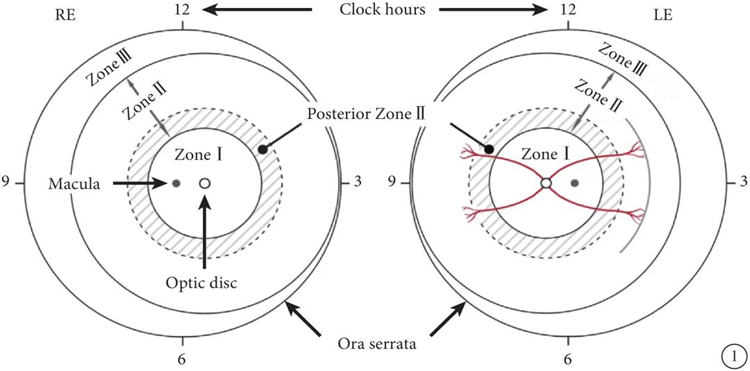

Zone 1 – Circle from centre of disc with radius of twice distance from disc to macula   
Zone 2 – From nasal edge of zone 1 to ora nasally and upto equatot region of retina temporally   
Posterior Zone II – ICROP3中继续保留了I区、II区和III区的定义，但细化了II区，提出了”后II区”的概念     
Zone 3 – From temporal crescent of retina anterior to zone II  
optic disc -  3 to 4 mm to the nasal side of the fovea. It is a vertical oval, with average dimensions of 1.76mm horizontally by 1.92mm vertically. There is a central depression, of variable size, called the optic cup.  
macula - has a diameter of around 5.5 mm (0.22 in). The fovea is located near the center of the macula. It is a small pit that contains the largest concentration of cone cells.

On a 512-pixel-high image, macula radius is 55, optic disk radius is 35. 

# Prepare the test.txt

This file contains all the image paths. We will use this file as input for the prediction process (test_frcnn.py)

In [1]:
import pandas as pd
from odn import utils

FILES = utils.get_all_images_in_dir('C:/Users/eleve/Desktop/横向2022/TO 分区/', '../data/fundus/test2.txt')
test_set = pd.read_csv('../data/fundus/test2.txt', header=None, encoding = 'gbk')
test_set

,0,1,2,3,4,5
0,C:/Users/eleve/Desktop/横向2022/TO 分区/注药/R23926-...,-1,-1,-1,-1,UNKNOWN
1,C:/Users/eleve/Desktop/横向2022/TO 分区/注药/R23926-...,-1,-1,-1,-1,UNKNOWN
2,C:/Users/eleve/Desktop/横向2022/TO 分区/注药/R23926-...,-1,-1,-1,-1,UNKNOWN
3,C:/Users/eleve/Desktop/横向2022/TO 分区/注药/R23926-...,-1,-1,-1,-1,UNKNOWN
4,C:/Users/eleve/Desktop/横向2022/TO 分区/注药/R23926-...,-1,-1,-1,-1,UNKNOWN
...,...,...,...,...,...,...
694,C:/Users/eleve/Desktop/横向2022/TO 分区/激光/R27401-...,-1,-1,-1,-1,UNKNOWN
695,C:/Users/eleve/Desktop/横向2022/TO 分区/激光/R27401-...,-1,-1,-1,-1,UNKNOWN
696,C:/Users/eleve/Desktop/横向2022/TO 分区/激光/R27401-...,-1,-1,-1,-1,UNKNOWN
697,C:/Users/eleve/Desktop/横向2022/TO 分区/激光/R27401-...,-1,-1,-1,-1,UNKNOWN



# Prediction

Predict on a new fudnus image set.

## 1. You may do it in cmd

```
cd to odn/frcnn, run:

python test_frcnn.py --network vgg16 -p ../../data/fundus/test2.txt --load models/vgg16/19e.hdf5 --num_rois 32 --write 
```
--num_rois: Number of ROIs per iteration. Higher means more memory use. Works like batch_size
--write: output annotated images to outputs


A `candidate_rois.txt` with all candidate ROIs is generated.

## 2. Or use in python

    wd = os.path.dirname(__file__) # + '/keras_frcnn/'
    fl = wd + '/filelist.tmp.txt'
    FILES = utils.get_all_images_in_dir(folder, fl)
    test_frcnn.predict_images(fl, 'vgg16', wd + '/models/vgg16/19e.hdf5', 32,
    fl + 'candidate.rois.txt')

# Filter Candidate ROIs by Priori Rules

In [3]:
from odn.fundus import annotation

annotation.rule_filter_rois(input_file = '../src/odn/test2.txt_candidate_rois.txt', 
    output_file = '../src/odn/test2.rois.txt',
    verbose = True)


-------- 
Input file: ../src/odn/test2.txt_candidate_rois.txt
   seq                                        filename      class      prob  \
0    0  OS-7e44d76e-a028-40a2-8578-47dfd73de497.13.png     Macula  0.999329   
1    1  OS-7e44d76e-a028-40a2-8578-47dfd73de497.13.png     Macula  0.800623   
2    2  OS-7e44d76e-a028-40a2-8578-47dfd73de497.13.png  OpticDisk  0.995841   
3    3  OS-7e44d76e-a028-40a2-8578-47dfd73de497.18.png     Macula  0.982125   
4    4  OS-7e44d76e-a028-40a2-8578-47dfd73de497.18.png     Macula  0.918702   

   width  height  xmin  ymin  xmax  ymax  
0    640     480   345   179   448   281  
1    640     480   448   217   537   307  
2    640     480   192   128   268   204  
3    640     480   307     0   512   102  
4    640     480   422    51   524   153  

-------- 
Indices of removed annos:  [282. 283. 241. 355. 299. 863. 359. 358. 679. 680. 648. 333. 334. 533.
 156. 327. 328. 853. 285. 668. 496. 651. 868. 174. 460.  40. 154. 211.
   1. 142. 144. 143. 216

,Unnamed: 0,seq,filename,class,prob,width,height,xmin,ymin,xmax,ymax
0,0,0,OS-7e44d76e-a028-40a2-8578-47dfd73de497.13.png,Macula,0.999329,640,480,345,179,448,281
1,2,2,OS-7e44d76e-a028-40a2-8578-47dfd73de497.13.png,OpticDisk,0.995841,640,480,192,128,268,204
2,3,3,OS-7e44d76e-a028-40a2-8578-47dfd73de497.18.png,Macula,0.982125,640,480,307,0,512,102
3,5,5,OS-7e44d76e-a028-40a2-8578-47dfd73de497.18.png,OpticDisk,0.920950,640,480,153,0,230,51
4,6,6,OS-7e44d76e-a028-40a2-8578-47dfd73de497.19.png,OpticDisk,0.994436,640,480,294,128,371,204
...,...,...,...,...,...,...,...,...,...,...,...
796,926,926,OD-d0b87c01-1325-4d7a-8c62-6eed370ff4ff.jpg,OpticDisk,0.998558,1440,1080,662,374,806,489
797,927,927,OD-298cb3fc-e166-45fb-8c2e-bc8df11e031f.jpg,Macula,0.882880,1440,1080,316,287,547,518
798,928,928,OD-3adb551f-dad0-4090-b3de-a73ec55ceb7c.jpg,Macula,0.850235,1440,1080,633,0,863,230
799,929,929,OD-3adb551f-dad0-4090-b3de-a73ec55ceb7c.jpg,OpticDisk,0.918675,1440,1080,979,115,1151,287


**The filtered ROIs are stored in rois.txt file**

# Render Images with ROIs

This exmaple uses inplace image generation, i.e., the output is in the same folder as original images.


----------- 
Content of  ../src/odn/test2.rois.txt
   Unnamed: 0  seq                                        filename      class  \
0           0    0  OS-7e44d76e-a028-40a2-8578-47dfd73de497.13.png     Macula   
1           2    2  OS-7e44d76e-a028-40a2-8578-47dfd73de497.13.png  OpticDisk   
2           3    3  OS-7e44d76e-a028-40a2-8578-47dfd73de497.18.png     Macula   
3           5    5  OS-7e44d76e-a028-40a2-8578-47dfd73de497.18.png  OpticDisk   
4           6    6  OS-7e44d76e-a028-40a2-8578-47dfd73de497.19.png  OpticDisk   

       prob  width  height  xmin  ymin  xmax  ymax  
0  0.999329    640     480   345   179   448   281  
1  0.995841    640     480   192   128   268   204  
2  0.982125    640     480   307     0   512   102  
3  0.920950    640     480   153     0   230    51  
4  0.994436    640     480   294   128   371   204  

----------- 
Unique image files:  574

----------- 
distribution of ROI labels:
OpticDisk    480
Macula       321
Name: class, dtype: int64


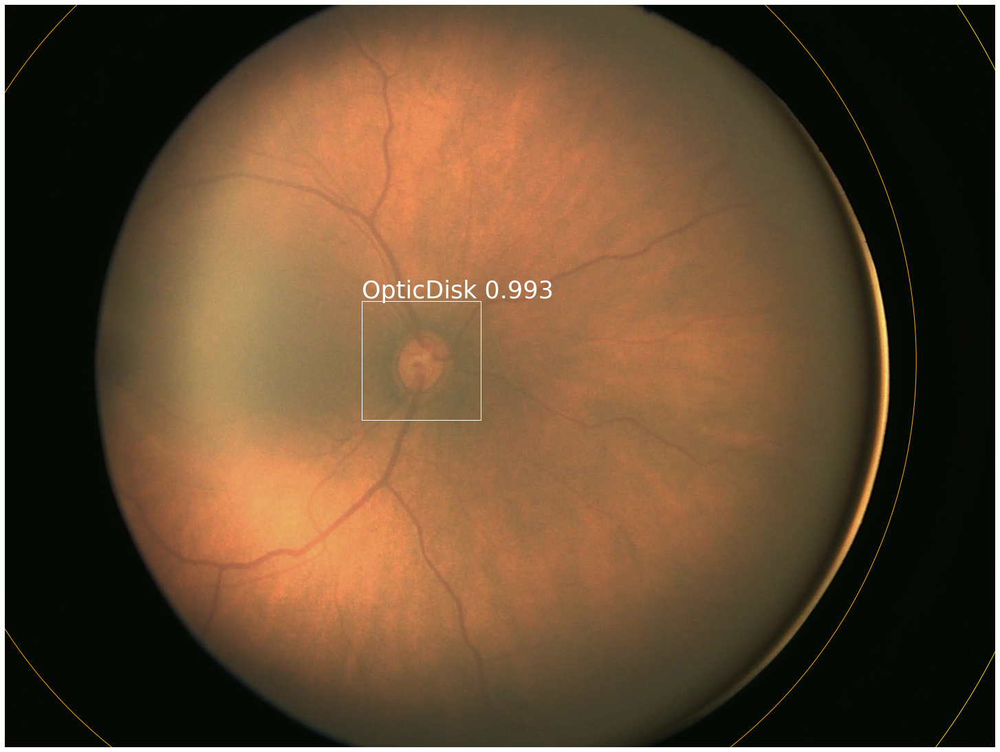

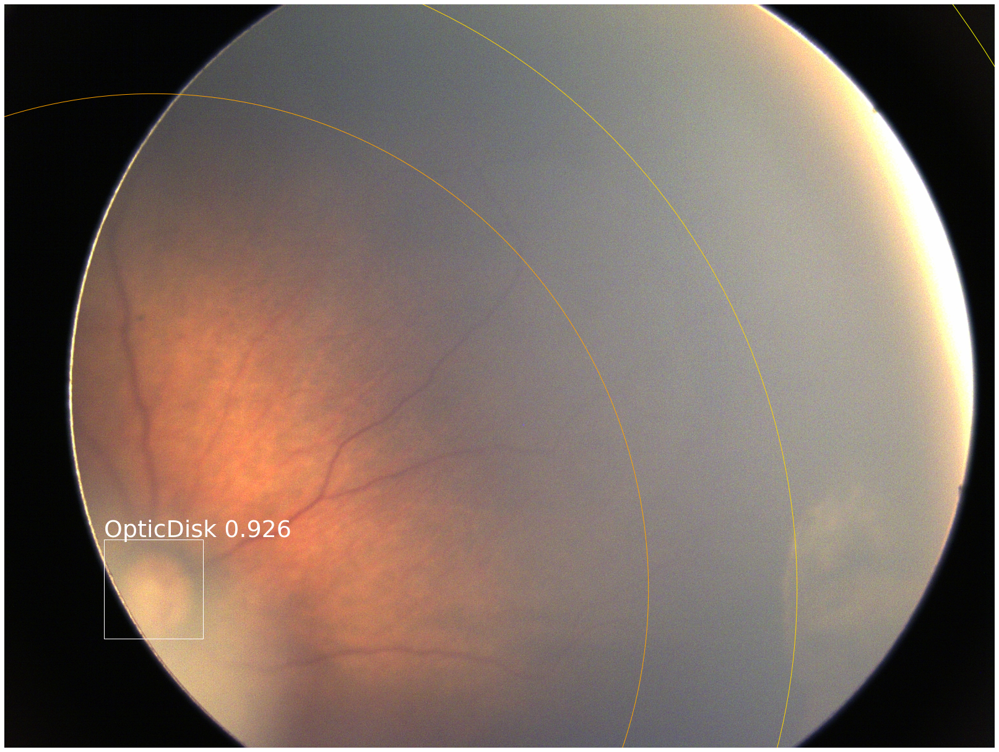

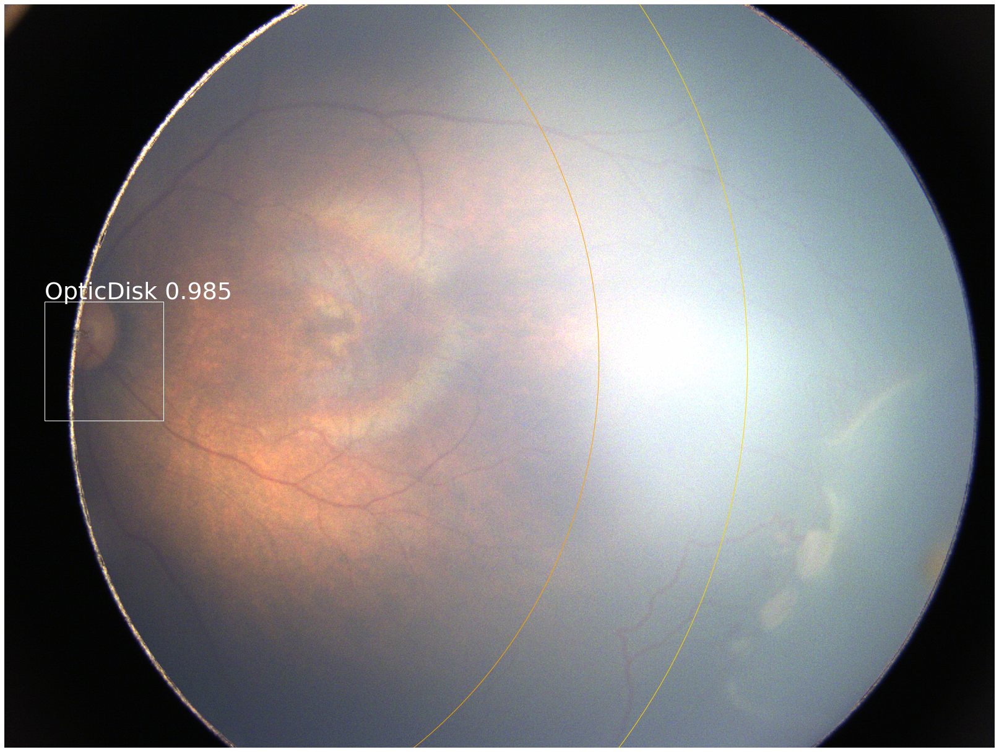

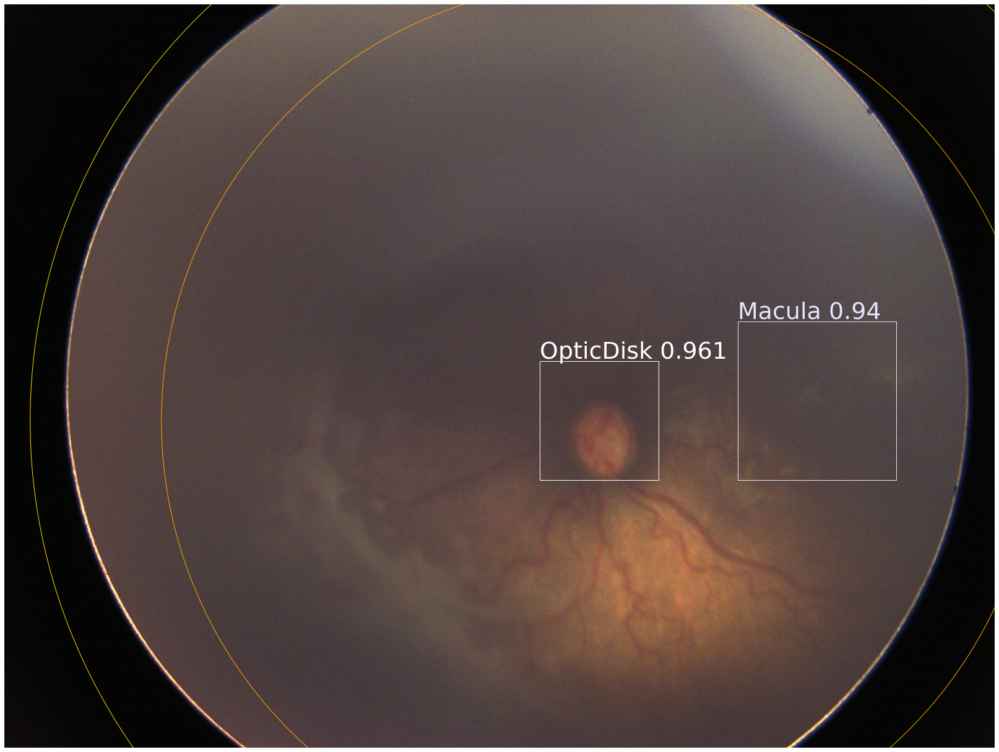

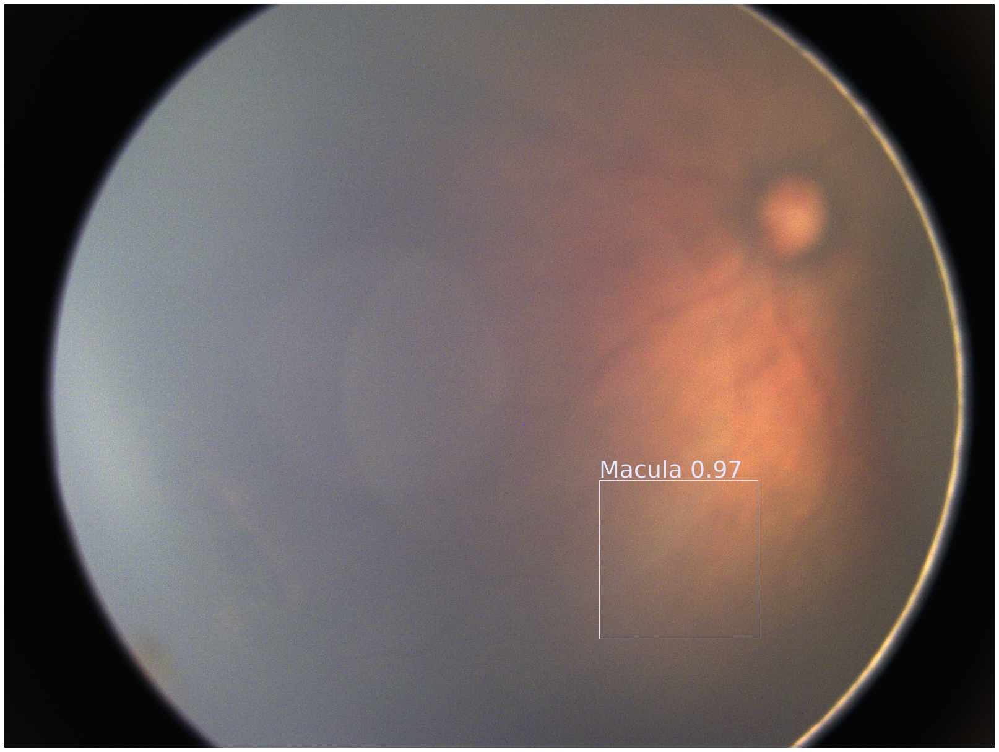

In [4]:
from odn.fundus import dataset
%matplotlib inline

dataset.synthesize_anno('../src/odn/test2.rois.txt', 
                        dir_images = 'C:/Users/eleve/Desktop/横向2022/TO 分区/', 
                        dir_output = 'inplace',
                        drawzones = True,
                        verbose = True,
                        suffix = '_FRCNN',
                        display = 5 )